1. Importación de librerías
Se importan librerías estándar de Python para manejo de datos (numpy, pandas, polars), visualización (matplotlib, seaborn), procesamiento paralelo (joblib, more_itertools), y machine learning (sklearn). Esto prepara el entorno para análisis, ingeniería de features y modelado.

In [1]:
import numpy as np
import pandas as pd
import gc
import os
import matplotlib.pyplot as plt
import polars as pl
from sklearn.metrics import mean_squared_error, mean_absolute_error
from joblib import Parallel, delayed
from more_itertools import chunked
from functools import reduce
from typing import List
from sklearn.preprocessing import LabelEncoder, StandardScaler
import joblib
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis
from joblib import Parallel, delayed
# --- Standard Library ---
import os
import json
import gc
from functools import reduce
from typing import List

# --- Data Handling ---
import numpy as np
import pandas as pd
import polars as pl
import joblib

# --- Visualization ---
import matplotlib.pyplot as plt

# --- Machine Learning ---
import optuna
from lightgbm import LGBMRegressor, early_stopping
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import LabelEncoder, StandardScaler

# --- Parallel Processing ---
from joblib import Parallel, delayed
from more_itertools import chunked

# --- PyTorch (if needed) ---
#import torch.nn as nn

import gc
import optuna
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor, early_stopping
from sklearn.metrics import mean_absolute_error, mean_squared_error
import pandas as pd
import numpy as np
import holidays
from calendar import monthrange

Se descarga y carga el dataset principal desde Google Drive, almacenándolo en el DataFrame df_agrupado.

In [2]:
url = "https://drive.google.com/uc?export=download&id=1jX8gtd7hpLwSrjwkasjG3TZJ3TGIvNzF"
df_agrupado = pd.read_csv(url)

🧠 Generación de características estadísticas sobre series temporales
En esta sección se definen funciones que generan un conjunto enriquecido de features estadísticas y temporales a partir de la evolución histórica de ventas (TN) por producto. Estas características permiten capturar patrones, tendencias, estacionalidades y comportamientos atípicos en la serie temporal, mejorando el poder predictivo de los modelos.

⚙️ add_global_features(group)
Esta función toma como entrada un subconjunto de datos correspondiente a un producto (o grupo) ordenado por periodo (PERIODO), y genera variables globales útiles para el análisis temporal:

- FECHA, MES: extracción de componentes temporales a partir del periodo.
- IS_FEBRERO: indicador binario para meses de febrero.
- ESTOY_PREDICIENDO_FEBRERO: flag para detectar si el periodo actual es diciembre (clave al predecir febrero en t+2).
- CAIDA_ABRUPTA: identifica caídas fuertes de un periodo a otro usando el umbral CAIDA_UMBRAL.
- PROM_ULT_3_FEBREROS: promedio de los últimos 3 valores de febrero previos al periodo actual.
- DIF_TN_VS_FEBREROS_ULT_3: diferencia entre el valor actual y dicho promedio.
- TN_MAX_HISTORICO: valor máximo de TN observado hasta el momento.
- TN_DIST_A_MAX_HIST y TN_RATIO_VS_MAX_HIST: diferencia y proporción del valor actual respecto al máximo histórico.
- Estas features globales permiten capturar efectos estacionales y de referencia en relación a eventos pasados del mismo mes.

Estas features globales permiten capturar efectos estacionales y de referencia en relación a eventos pasados del mismo mes.

🔁 calcular_pendientes_grupo(group, periodos_list)
Esta función extiende add_global_features y calcula una gran cantidad de estadísticas móviles (rolling features) sobre ventanas temporales de tamaños especificados en periodos_list (por ejemplo, 3, 6, 12 meses).

Para cada ventana cant, se calculan:

📊 Estadísticas básicas:
TN_MEAN_xx, TN_MEDIAN_xx, TN_MIN_xx, TN_MAX_xx, TN_STD_xx, TN_SUM_xx, TN_IQR_xx, TN_GROWTH_xx, etc.

📈 Tendencia y dispersión:
- PENDIENTE_TENDENCIA_xx: pendiente de una regresión lineal sobre la ventana.
- TN_SKEW_xx, TN_KURT_xx: asimetría y curtosis.

📌 Indicadores útiles:
- TN_COUNT_POS_xx: cantidad de valores positivos.
- TN_PCT_ZERO_xx: proporción de ceros.
- TN_LAST_xx, TN_LAST_DIFF_xx: último valor y su variación respecto al anterior.
- TN_LAST_PCT_SUM_xx: cuánto representa el último valor del total. 
- TN_ZEROS_END_xx: cuántos ceros consecutivos hay al final de la ventana.
- TN_PCT10_xx, TN_PCT90_xx, TN_PCT_WIDTH_xx: percentiles y amplitud interpercentil.

🔄 Comparaciones del valor actual (TN) con estadísticas móviles:
- TN_MINUS_MEAN_xx, TN_MINUS_MEDIAN_xx, TN_MINUS_EWMA_xx: diferencia respecto a media, mediana y suavizado exponencial.
- TN_OVER_MEAN_xx, TN_OVER_MEDIAN_xx, TN_OVER_EWMA_xx: razón del valor actual sobre estas estadísticas.

🧭 Dinámica temporal:
- TN_CHANGE_PREV_WINDOW_xx: cambio entre la media de la ventana actual y la anterior.
- TN_LAST_VS_MEDIAN_xx: diferencia entre el último valor y la mediana de la ventana.

In [3]:
# --- Configuración de feriados para Argentina ---
feriados_ar = holidays.AR()

# --- Función auxiliar para PERIODO + 2 ---
def extraer_info_calendario(periodo):
    try:
        anio = int(str(periodo)[:4])
        mes = int(str(periodo)[4:])
        mes_pred = mes + 2
        anio_pred = anio
        if mes_pred > 12:
            mes_pred -= 12
            anio_pred += 1
        
        dias_mes = monthrange(anio_pred, mes_pred)[1]
        fechas_mes = pd.date_range(start=f"{anio_pred}-{mes_pred:02d}-01", periods=dias_mes)

        dias_habiles = fechas_mes[fechas_mes.weekday < 5]
        feriados = [f for f in fechas_mes if f in feriados_ar]
        dias_laborables = [d for d in dias_habiles if d not in feriados]

        return pd.Series({
            "DIAS_MES_PRED": dias_mes,
            "DIAS_HABILES_PRED": len(dias_habiles),
            "FERIADOS_PRED": len(feriados),
            "DIAS_LABORABLES_PRED": len(dias_laborables),
        })
    except:
        return pd.Series({
            "DIAS_MES_PRED": np.nan,
            "DIAS_HABILES_PRED": np.nan,
            "FERIADOS_PRED": np.nan,
            "DIAS_LABORABLES_PRED": np.nan,
        })

# --- Aplicar al DataFrame ---
df_agrupado = df_agrupado.copy()
df_agrupado = df_agrupado.join(df_agrupado['PERIODO'].apply(extraer_info_calendario))

# --- Verificación rápida ---
print(df_agrupado[['PERIODO', 'DIAS_MES_PRED', 'DIAS_HABILES_PRED', 'FERIADOS_PRED', 'DIAS_LABORABLES_PRED']].head())


   PERIODO  DIAS_MES_PRED  DIAS_HABILES_PRED  FERIADOS_PRED  \
0   201704             30                 22              2   
1   201903             31                 23              2   
2   201903             31                 23              2   
3   201812             28                 20              0   
4   201806             31                 23              1   

   DIAS_LABORABLES_PRED  
0                    21  
1                    22  
2                    22  
3                    20  
4                    22  


In [4]:
ROLL_BASE = 12
CAIDA_UMBRAL = -100

def add_global_features(group):
    group = group.sort_values('PERIODO').copy()
    group['FECHA'] = pd.to_datetime(group['PERIODO'].astype(str), format='%Y%m')
    group['MES'] = group['FECHA'].dt.month
    group['IS_FEBRERO'] = (group['MES'] == 2).astype(int)
    group['ESTOY_PREDICIENDO_FEBRERO'] = (group['MES'] == 12).astype(int)

    group['CAIDA_ABRUPTA'] = (group['TN'].diff(1) < CAIDA_UMBRAL).astype(int)
    
    # Tomar solo los febreros históricos
    febreros = group[group['MES'] == 2][['PERIODO', 'TN']].sort_values('PERIODO').reset_index(drop=True)
    # Calcular el rolling promedio (sin el actual, siempre pasado)
    febreros['PROM_ULT_3_FEBREROS'] = febreros['TN'].shift(1).rolling(window=3, min_periods=1).mean()
    
    # Hacer merge con el original: para cada PERIODO, ¿cuál fue el último promedio disponible?
    # Vamos a usar merge_asof para asignar el promedio más reciente antes o igual al periodo actual
    group = group.sort_values('PERIODO').reset_index(drop=True)
    group = pd.merge_asof(
        group, 
        febreros[['PERIODO', 'PROM_ULT_3_FEBREROS']],
        by=None, left_on='PERIODO', right_on='PERIODO', 
        direction='backward', 
        allow_exact_matches=False
    )
    # Si no hay historial, pone cero (puede cambiar a np.nan si preferís)
    group['PROM_ULT_3_FEBREROS'] = group['PROM_ULT_3_FEBREROS'].fillna(0)
    group['DIF_TN_VS_FEBREROS_ULT_3'] = group['TN'] - group['PROM_ULT_3_FEBREROS']



    # Max histórico HASTA el momento (expanding + shift)
    group['TN_MAX_HISTORICO'] = group['TN'].shift(1).expanding().max().fillna(0)
    group['TN_DIST_A_MAX_HIST'] = group['TN_MAX_HISTORICO'] - group['TN']
    group['TN_RATIO_VS_MAX_HIST'] = (group['TN'] / (group['TN_MAX_HISTORICO'] + 1e-8)).clip(lower=0, upper=5)


    return group


def calcular_pendientes_grupo(group, periodos_list):
    group = add_global_features(group)
    group = group.sort_values(by='PERIODO').copy()
    n = len(group)
    y_values = group['TN'].values
    for cant in periodos_list:
        means = np.zeros(n)
        pendientes = np.zeros(n)
        ewmas = np.zeros(n)
        medians = np.zeros(n)
        minimo = np.zeros(n)
        maximo = np.zeros(n)
        stds = np.zeros(n)
        skews = np.zeros(n)
        kurts = np.zeros(n)
        growths = np.zeros(n)
        iqrs = np.zeros(n)
        sums = np.zeros(n)
        count_pos = np.zeros(n)
        pct_zero = np.zeros(n)
        last = np.zeros(n)
        last_diff = np.zeros(n)

        coef_var = np.zeros(n)
        maxmin_ratio = np.zeros(n)
        rango = np.zeros(n)
        rango_rel = np.zeros(n)
        last_vs_median = np.zeros(n)
        cambio_ventana = np.zeros(n)
        zeros_end = np.zeros(n)
        last_pct_sum = np.zeros(n)
        pct_90 = np.zeros(n)
        pct_10 = np.zeros(n)
        pct_width = np.zeros(n)

        # --- Comparaciones TN vs rolling stats ---
        tn_minus_mean = np.zeros(n)
        tn_minus_median = np.zeros(n)
        tn_minus_ewma = np.zeros(n)
        tn_over_mean = np.zeros(n)
        tn_over_median = np.zeros(n)
        tn_over_ewma = np.zeros(n)

        x = np.arange(cant)
        for i in range(n):
            # Solo procesar si la ventana está completa
            if i >= cant - 1:
                y = y_values[i - (cant - 1): i + 1]
                means[i] = np.mean(y)
                try:
                    pendientes[i] = np.polyfit(x, y, 1)[0]
                except:
                    pendientes[i] = 0
                ewmas[i] = pd.Series(y).ewm(span=cant, adjust=False).mean().iloc[-1]
                medians[i] = np.median(y)
                minimo[i] = np.min(y)
                maximo[i] = np.max(y)
                std_y = np.std(y)
                mean_y = means[i]
                stds[i] = std_y
                skews[i] = skew(y) if std_y > 0 else 0
                kurts[i] = kurtosis(y) if std_y > 0 else 0
                growths[i] = (y[-1] - y[0]) / (y[0] + 1e-8) if y[0] != 0 else 0
                iqrs[i] = np.percentile(y, 75) - np.percentile(y, 25)
                sums[i] = np.sum(y)
                count_pos[i] = np.sum(y > 0)
                pct_zero[i] = np.mean(y == 0)
                last[i] = y[-1]
                last_diff[i] = y[-1] - y[-2] if cant > 1 else 0

                coef_var[i] = std_y / (mean_y + 1e-8) if mean_y != 0 else 0
                maxmin_ratio[i] = maximo[i] / (minimo[i] + 1e-8) if minimo[i] != 0 else 0
                rango[i] = maximo[i] - minimo[i]
                rango_rel[i] = rango[i] / (minimo[i] + 1e-8) if minimo[i] != 0 else 0
                last_vs_median[i] = y[-1] - np.median(y)
                # Cambio de ventana anterior a actual
                if i >= 2 * cant - 1:
                    y_prev = y_values[i - (2 * cant - 1):i - cant + 1]
                    mean_prev = np.mean(y_prev)
                    cambio_ventana[i] = (mean_y - mean_prev) / (mean_prev + 1e-8) if mean_prev != 0 else 0
                zeros_end[i] = np.argmax(y[::-1] != 0)
                last_pct_sum[i] = y[-1] / (np.sum(y) + 1e-8) if np.sum(y) != 0 else 0
                pct_90[i] = np.percentile(y, 90)
                pct_10[i] = np.percentile(y, 10)
                pct_width[i] = pct_90[i] - pct_10[i]

                # Comparaciones TN vs rolling stats
                tn_actual = y_values[i]
                tn_minus_mean[i] = tn_actual - means[i]
                tn_minus_median[i] = tn_actual - medians[i]
                tn_minus_ewma[i] = tn_actual - ewmas[i]
                tn_over_mean[i] = tn_actual / (means[i] + 1e-8) if means[i] != 0 else 0
                tn_over_median[i] = tn_actual / (medians[i] + 1e-8) if medians[i] != 0 else 0
                tn_over_ewma[i] = tn_actual / (ewmas[i] + 1e-8) if ewmas[i] != 0 else 0
            # Si la ventana no está completa, todo queda en cero (ya inicializado)

        group[f'TN_MEAN_{str(cant).zfill(2)}'] = means
        group[f'PENDIENTE_TENDENCIA_{cant}'] = pendientes
        group[f'TN_EWMA_{str(cant).zfill(2)}'] = ewmas
        group[f'TN_MEDIAN_{str(cant).zfill(2)}'] = medians
        group[f'TN_MIN_{str(cant).zfill(2)}'] = minimo
        group[f'TN_MAX_{str(cant).zfill(2)}'] = maximo
        group[f'TN_STD_{str(cant).zfill(2)}'] = stds
        group[f'TN_SKEW_{str(cant).zfill(2)}'] = skews
        group[f'TN_KURT_{str(cant).zfill(2)}'] = kurts
        group[f'TN_GROWTH_{str(cant).zfill(2)}'] = growths
        group[f'TN_IQR_{str(cant).zfill(2)}'] = iqrs
        group[f'TN_SUM_{str(cant).zfill(2)}'] = sums
        group[f'TN_COUNT_POS_{str(cant).zfill(2)}'] = count_pos
        group[f'TN_PCT_ZERO_{str(cant).zfill(2)}'] = pct_zero
        group[f'TN_LAST_{str(cant).zfill(2)}'] = last
        group[f'TN_LAST_DIFF_{str(cant).zfill(2)}'] = last_diff

        group[f'TN_COEF_VAR_{cant}'] = coef_var
        group[f'TN_MAXMIN_RATIO_{cant}'] = maxmin_ratio
        group[f'TN_RANGO_{cant}'] = rango
        group[f'TN_RANGO_REL_{cant}'] = rango_rel
        group[f'TN_LAST_VS_MEDIAN_{cant}'] = last_vs_median
        group[f'TN_CHANGE_PREV_WINDOW_{cant}'] = cambio_ventana
        group[f'TN_ZEROS_END_{cant}'] = zeros_end
        group[f'TN_LAST_PCT_SUM_{cant}'] = last_pct_sum
        group[f'TN_PCT90_{cant}'] = pct_90
        group[f'TN_PCT10_{cant}'] = pct_10
        group[f'TN_PCT_WIDTH_{cant}'] = pct_width

        # Comparaciones TN vs rolling stats
        group[f'TN_MINUS_MEAN_{str(cant).zfill(2)}'] = tn_minus_mean
        group[f'TN_MINUS_MEDIAN_{str(cant).zfill(2)}'] = tn_minus_median
        group[f'TN_MINUS_EWMA_{str(cant).zfill(2)}'] = tn_minus_ewma
        group[f'TN_OVER_MEAN_{str(cant).zfill(2)}'] = tn_over_mean
        group[f'TN_OVER_MEDIAN_{str(cant).zfill(2)}'] = tn_over_median
        group[f'TN_OVER_EWMA_{str(cant).zfill(2)}'] = tn_over_ewma

    return group

⚙️ Cálculo paralelo de estadísticas temporales por producto
Se define una función llamada calcular_pendientes_parallel que aplica la ingeniería de variables temporales sobre el conjunto completo de productos de forma paralela, lo que permite acelerar considerablemente el procesamiento.

🧩 Descripción del procedimiento
Agrupamiento por producto
Se separan los datos por PRODUCT_ID, de modo que cada grupo contenga la serie temporal correspondiente a un único producto.

Procesamiento en paralelo
Usando joblib.Parallel, se aplica la función calcular_pendientes_grupo (que genera estadísticas móviles e indicadores por ventana) a cada grupo de productos en paralelo, distribuyendo el trabajo en n_jobs procesos.

Unificación de resultados
Se concatenan todos los resultados en un único DataFrame (df_final), garantizando que no queden valores infinitos ni nulos (NaN), reemplazándolos por cero para mantener consistencia.

⚙️ Parámetros principales
df: DataFrame original agrupado por producto.

periodos_list: lista de tamaños de ventanas móviles sobre las cuales se calculan las estadísticas.

n_jobs: número de procesos paralelos a utilizar (ajustable según los núcleos disponibles).

In [5]:
def calcular_pendientes_parallel(df, periodos_list=[3, 6, 9, 12, 18], n_jobs=28):
    grupos = [group for _, group in df.groupby('PRODUCT_ID')]
    resultados = Parallel(n_jobs=n_jobs, backend='loky', verbose=10)(
        delayed(calcular_pendientes_grupo)(group, periodos_list) for group in grupos
    )
    df_final = pd.concat(resultados, ignore_index=True)
    df_final.replace([np.inf, -np.inf], 0, inplace=True)
    df_final.fillna(0, inplace=True)
    return df_final

df_agrupado = calcular_pendientes_parallel(df_agrupado, periodos_list=[3, 6, 9, 12, 18], n_jobs=28)

[Parallel(n_jobs=28)]: Using backend LokyBackend with 28 concurrent workers.
/tmp/ipykernel_57504/3522841782.py:172: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
/tmp/ipykernel_57504/3522841782.py:173: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
/tmp/ipykernel_57504/3522841782.py:174: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

### 🔁 Generación de variables lag y delta

Se generan variables `lag` y `delta` sobre la variable objetivo `TN`, calculadas por grupo de producto (`PRODUCT_ID`) y ordenadas de forma descendente por el campo `ORDINAL`.

Para cada ventana temporal definida en `lags = [3, 6, 9, 12, 18]`, se calculan:

- `TN_LAG_xx`: valor de `TN` con un desplazamiento hacia el futuro de `xx` periodos (dado que el orden es descendente).
- `TN_DELTA_xx`: diferencia entre el valor actual de `TN` y su respectivo `lag`.

Estas variables permiten capturar el comportamiento reciente de la serie y medir variaciones en diferentes horizontes temporales.

In [6]:
lags = [3, 6, 9, 12, 18]
group_cols = ['PRODUCT_ID']

# Ordenar de forma cronológica (ORDINAL ascendente)
df_agrupado = df_agrupado.sort_values(group_cols + ['ORDINAL'], ascending=[True, True])

for lag in lags:
    lag_col = f'TN_LAG_{lag:02d}'
    delta_col = f'TN_DELTA_{lag:02d}'
    
    # Lag tradicional: hacia el pasado (ej. en t=10, el lag 3 es t=7)
    df_agrupado[lag_col] = (
        df_agrupado.groupby(group_cols)['TN']
        .shift(lag)  # ✅ correcto: va al pasado
        .fillna(0)
    )
    
    # Delta entre el valor actual y el de hace n períodos
    df_agrupado[delta_col] = df_agrupado['TN'] - df_agrupado[lag_col]


### 📈 Cálculo de métricas adicionales sobre ventanas móviles

Sobre ventanas móviles de 3, 6, 9, 12 y 18 periodos, se generaron nuevas variables por producto (`PRODUCT_ID`) a partir de la serie `TN`, con el objetivo de capturar distintos aspectos del comportamiento reciente de la serie.

Para cada ventana se calcularon:

- `TN_GROWTH_xx`: crecimiento porcentual respecto al valor observado `xx` periodos atrás (`lag`).
- `TN_COUNT_ZERO_xx`: cantidad de ceros en la ventana.
- `TN_SIGN_CHANGES_xx`: cantidad de cambios de signo (positivo ↔ negativo).
- `TN_COEF_VAR_xx`: coeficiente de variación, como relación entre el desvío estándar y la media.
- `TN_OUTLIER_PROP_xx`: proporción de valores considerados outliers (más de 2 desvíos estándar respecto a la media).
- `TN_PCT_POS_xx`: proporción de ventas mayores a cero.

Estas variables permiten describir la estabilidad, dispersión, presencia de outliers y comportamiento general reciente de la variable objetivo.


In [7]:
# --- Parámetros ---
windows = [3, 6, 9, 12, 18]
group_cols = ['PRODUCT_ID']  # Podés agregar más si agrupás por otras claves
target_col = 'TN'

# --- Asegurar orden temporal correcto para rolling ---
df_agrupado = df_agrupado.sort_values(group_cols + ['ORDINAL'], ascending=True)

# --- Función auxiliar para proporción de outliers (> 2 * std) ---
def outlier_prop(x):
    m = np.nanmean(x)
    s = np.nanstd(x)
    if s == 0:
        return 0
    return np.mean(np.abs(x - m) > 2 * s)

# --- Loop por cada ventana temporal ---
for w in windows:
    # 1. CRECIMIENTO PERCENTUAL (respecto al lag ya calculado)
    lag_col = f'{target_col}_LAG_{w:02d}'
    growth_col = f'{target_col}_GROWTH_{w:02d}'
    if lag_col in df_agrupado.columns:
        df_agrupado[growth_col] = (
            (df_agrupado[target_col] - df_agrupado[lag_col]) /
            (df_agrupado[lag_col].replace(0, np.nan))
        ).fillna(0)

    # 2. CANTIDAD DE CEROS en la ventana
    count_zero_col = f'{target_col}_COUNT_ZERO_{w:02d}'
    df_agrupado[count_zero_col] = (
        df_agrupado
        .groupby(group_cols)[target_col]
        .rolling(window=w, min_periods=1)
        .apply(lambda x: np.sum(x == 0), raw=True)
        .reset_index(level=0, drop=True)
    )

    # 3. CAMBIOS DE SIGNO
    sign_change_col = f'{target_col}_SIGN_CHANGES_{w:02d}'
    df_agrupado[sign_change_col] = (
        df_agrupado
        .groupby(group_cols)[target_col]
        .rolling(window=w, min_periods=2)
        .apply(lambda x: np.sum(np.diff(np.sign(x)) != 0), raw=True)
        .reset_index(level=0, drop=True)
    )

    # 4. MEDIA y DESVÍO ESTÁNDAR (si no existen)
    mean_col = f'{target_col}_MEAN_{w:02d}'
    std_col = f'{target_col}_STD_{w:02d}'
    if mean_col not in df_agrupado.columns:
        df_agrupado[mean_col] = (
            df_agrupado.groupby(group_cols)[target_col]
            .rolling(window=w, min_periods=1)
            .mean()
            .reset_index(level=0, drop=True)
        )
    if std_col not in df_agrupado.columns:
        df_agrupado[std_col] = (
            df_agrupado.groupby(group_cols)[target_col]
            .rolling(window=w, min_periods=1)
            .std()
            .fillna(0)
            .reset_index(level=0, drop=True)
        )

    # 5. COEFICIENTE DE VARIACIÓN
    coef_var_col = f'{target_col}_COEF_VAR_{w:02d}'
    df_agrupado[coef_var_col] = (
        df_agrupado[std_col] / df_agrupado[mean_col].replace(0, np.nan)
    ).fillna(0)

    # 6. PROPORCIÓN DE OUTLIERS
    outlier_col = f'{target_col}_OUTLIER_PROP_{w:02d}'
    df_agrupado[outlier_col] = (
        df_agrupado
        .groupby(group_cols)[target_col]
        .rolling(window=w, min_periods=2)
        .apply(outlier_prop, raw=True)
        .reset_index(level=0, drop=True)
    )

    # 7. PROPORCIÓN DE VALORES POSITIVOS
    pct_pos_col = f'{target_col}_PCT_POS_{w:02d}'
    df_agrupado[pct_pos_col] = (
        df_agrupado
        .groupby(group_cols)[target_col]
        .rolling(window=w, min_periods=1)
        .apply(lambda x: np.mean(x > 0), raw=True)
        .reset_index(level=0, drop=True)
    )

# --- Columnas generadas (opcional para ver resumen) ---
cols_new = []
for w in windows:
    cols_new += [
        f'{target_col}_GROWTH_{w:02d}',
        f'{target_col}_COUNT_ZERO_{w:02d}',
        f'{target_col}_SIGN_CHANGES_{w:02d}',
        f'{target_col}_MEAN_{w:02d}',
        f'{target_col}_STD_{w:02d}',
        f'{target_col}_COEF_VAR_{w:02d}',
        f'{target_col}_OUTLIER_PROP_{w:02d}',
        f'{target_col}_PCT_POS_{w:02d}',
    ]

# Verificación rápida
print("Nuevas columnas generadas:")
print(cols_new)
print(df_agrupado[cols_new].isna().sum())

Nuevas columnas generadas:
['TN_GROWTH_03', 'TN_COUNT_ZERO_03', 'TN_SIGN_CHANGES_03', 'TN_MEAN_03', 'TN_STD_03', 'TN_COEF_VAR_03', 'TN_OUTLIER_PROP_03', 'TN_PCT_POS_03', 'TN_GROWTH_06', 'TN_COUNT_ZERO_06', 'TN_SIGN_CHANGES_06', 'TN_MEAN_06', 'TN_STD_06', 'TN_COEF_VAR_06', 'TN_OUTLIER_PROP_06', 'TN_PCT_POS_06', 'TN_GROWTH_09', 'TN_COUNT_ZERO_09', 'TN_SIGN_CHANGES_09', 'TN_MEAN_09', 'TN_STD_09', 'TN_COEF_VAR_09', 'TN_OUTLIER_PROP_09', 'TN_PCT_POS_09', 'TN_GROWTH_12', 'TN_COUNT_ZERO_12', 'TN_SIGN_CHANGES_12', 'TN_MEAN_12', 'TN_STD_12', 'TN_COEF_VAR_12', 'TN_OUTLIER_PROP_12', 'TN_PCT_POS_12', 'TN_GROWTH_18', 'TN_COUNT_ZERO_18', 'TN_SIGN_CHANGES_18', 'TN_MEAN_18', 'TN_STD_18', 'TN_COEF_VAR_18', 'TN_OUTLIER_PROP_18', 'TN_PCT_POS_18']
TN_GROWTH_03            0
TN_COUNT_ZERO_03        0
TN_SIGN_CHANGES_03    780
TN_MEAN_03              0
TN_STD_03               0
TN_COEF_VAR_03          0
TN_OUTLIER_PROP_03    780
TN_PCT_POS_03           0
TN_GROWTH_06            0
TN_COUNT_ZERO_06        0
TN

Estadísticas básicas de CLASE:
count    22375.000000
mean        47.261061
std        123.097039
min          0.000000
25%          2.041395
50%         10.062170
75%         32.214200
max       2295.198320
Name: CLASE, dtype: float64

Primeros valores únicos (si son pocos): [1300.46995 1069.71506 1501.89911 1520.06539 1030.67391 1266.72304
 1315.64765 1439.75563 1580.35089 1049.3886 ]
Cantidad de valores únicos: 20622

Cantidad de nulos: 0


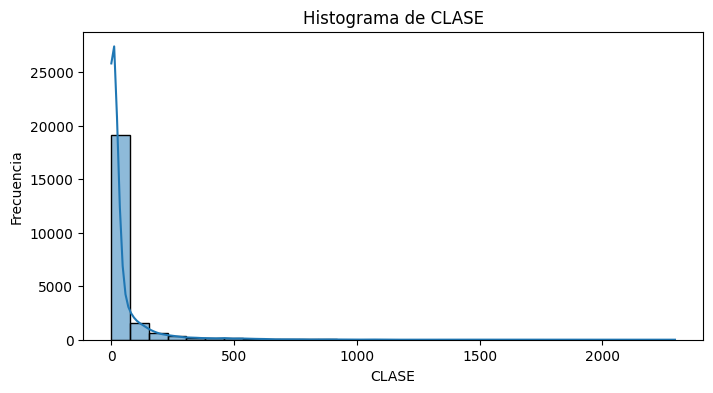

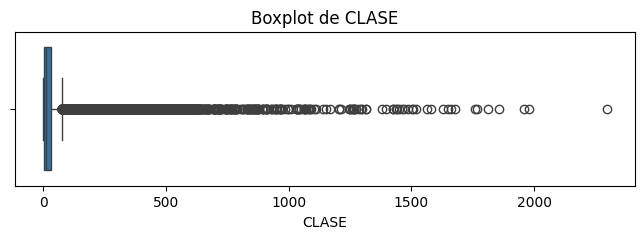

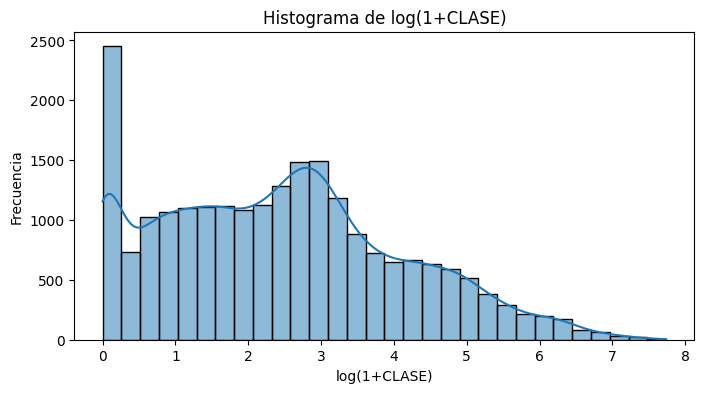


Percentiles de CLASE:
0.00       0.000000
0.01       0.000000
0.05       0.000000
0.25       2.041395
0.50      10.062170
0.75      32.214200
0.95     217.743778
0.99     605.542223
1.00    2295.198320
Name: CLASE, dtype: float64

Cantidad de outliers (>3 desvíos): 502


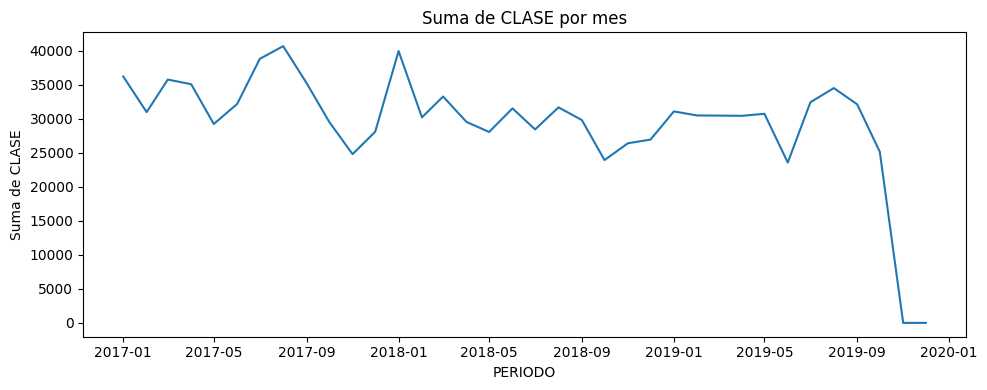

In [8]:
# Hacer un EDA de la columna  CLASE en  df_agrupado
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Estadísticas descriptivas ---
print("Estadísticas básicas de CLASE:")
print(df_agrupado['CLASE'].describe())

print("\nPrimeros valores únicos (si son pocos):", df_agrupado['CLASE'].unique()[:10])
print("Cantidad de valores únicos:", df_agrupado['CLASE'].nunique())

print("\nCantidad de nulos:", df_agrupado['CLASE'].isna().sum())

# --- Histograma ---
plt.figure(figsize=(8,4))
sns.histplot(df_agrupado['CLASE'], bins=30, kde=True)
plt.title("Histograma de CLASE")
plt.xlabel("CLASE")
plt.ylabel("Frecuencia")
plt.show()

# --- Boxplot para ver outliers ---
plt.figure(figsize=(8,2))
sns.boxplot(x=df_agrupado['CLASE'])
plt.title("Boxplot de CLASE")
plt.show()

# --- Distribución log-transformada (útil si hay muchos valores chicos y pocos grandes) ---
plt.figure(figsize=(8,4))
sns.histplot(np.log1p(df_agrupado['CLASE']), bins=30, kde=True)
plt.title("Histograma de log(1+CLASE)")
plt.xlabel("log(1+CLASE)")
plt.ylabel("Frecuencia")
plt.show()

# --- Percentiles y cuantiles ---
print("\nPercentiles de CLASE:")
print(df_agrupado['CLASE'].quantile([0, 0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99, 1]))

# --- Outliers extremos (más allá de 3 desviaciones estándar) ---
media = df_agrupado['CLASE'].mean()
std = df_agrupado['CLASE'].std()
outliers = df_agrupado[(df_agrupado['CLASE'] > media + 3*std) | (df_agrupado['CLASE'] < media - 3*std)]
print(f"\nCantidad de outliers (>3 desvíos): {len(outliers)}")


# --- Suma de CLASE por PERIODO y visualización temporal ---
if 'PERIODO' in df_agrupado.columns:
    # Agrupar y sumar CLASE por PERIODO
    df_suma_clase = df_agrupado.groupby('PERIODO', as_index=False)['CLASE'].sum()
    
    # Convertir PERIODO a fecha para mejor visualización
    df_suma_clase['PERIODO_FECHA'] = pd.to_datetime(df_suma_clase['PERIODO'].astype(str), format='%Y%m')

    # Graficar
    plt.figure(figsize=(10, 4))
    sns.lineplot(x='PERIODO_FECHA', y='CLASE', data=df_suma_clase, errorbar=None)
    #sns.lineplot(x='PERIODO_FECHA', y='CLASE', data=df_suma_clase, ci=None)
    plt.title("Suma de CLASE por mes")
    plt.xlabel("PERIODO")
    plt.ylabel("Suma de CLASE")
    plt.tight_layout()
    plt.show()



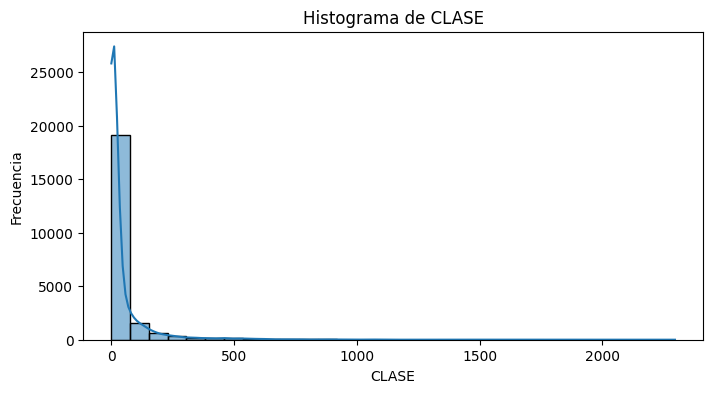

📊 Análisis de distribución: variable CLASE
🔹 Histograma original (CLASE)
El primer gráfico muestra el histograma de la variable CLASE sin transformar. Se observa una alta concentración de valores en el rango bajo, con una gran cantidad de registros cercanos a cero y una cola larga hacia la derecha, que indica la presencia de valores atípicos altos (distribución fuertemente asimétrica positiva).

Este tipo de distribución sesgada es común en variables de conteo o montos que pueden tomar muchos valores pequeños y algunos grandes (como ingresos, ventas, etc.). En este caso:

La mayoría de los valores están por debajo de 100.

Existen valores extremos por encima de 2000, aunque poco frecuentes.

Esta asimetría puede afectar negativamente el rendimiento de modelos sensibles a la escala o la normalidad de los datos (por ejemplo, regresión lineal o redes neuronales sin normalización adecuada).

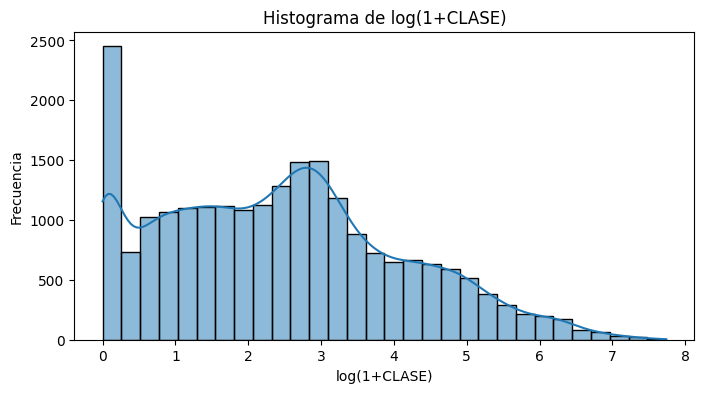

🔹 Histograma transformado (log(1 + CLASE))
El segundo gráfico muestra el histograma de log(1 + CLASE). Se aplica log(1 + x) para manejar los ceros sin generar valores indefinidos, ya que log(0) no está definido.

Con esta transformación:

La distribución se vuelve mucho más simétrica y cercana a una forma aproximadamente normal o al menos continua y más balanceada.

Los valores atípicos son "comprimidos", lo que reduce su efecto desproporcionado sobre los modelos.

La dispersión de los datos mejora, favoreciendo algoritmos que se benefician de distribuciones menos sesgadas (como MLP, k-NN, clustering, etc.).

✅ Justificación de la transformación
Transformar CLASE mediante log(1 + CLASE) es una práctica adecuada cuando:

La variable tiene valores positivos y altamente asimétricos, como en este caso.

Se quiere reducir el impacto de los outliers o valores extremos.

Se busca estabilizar la varianza para mejorar la calidad del modelado.

Se desea facilitar el entrenamiento de modelos lineales o redes neuronales que pueden verse perjudicadas por escalas tan dispares.



In [9]:
df_agrupado['CLASE_LOG1P'] = np.log1p(df_agrupado['CLASE'])

# Eliminar las columnas CLASE  para evitar confusiones
df_agrupado.drop(columns=['CLASE'], inplace=True, errors='ignore')

In [12]:
# Eliminar de df_agrupado la columna FECHA
df_agrupado = df_agrupado.drop(columns=['FECHA'], errors='ignore')

In [13]:
cat_cols = ['ID_CAT1', 'ID_CAT2', 'ID_CAT3', 'ID_BRAND', 'SKU_SIZE','MES_PROBLEMATICO',
            'IS_FEBRERO', 'ESTOY_PREDICIENDO_FEBRERO','CAIDA_ABRUPTA']

for col in cat_cols:
    if col in df_agrupado.columns:
        df_agrupado[col] = df_agrupado[col].astype('category')

In [14]:
df_agrupado.to_csv('./data/product_interm_LGBM.csv', index=False)

In [15]:
# df_full = pd.read_parquet('./data/product_interm_LGBM.parquet', engine='fastparquet')
# Separar conjuntos
df_full = df_agrupado
df_train = df_full[df_full['PERIODO'] <= 201812].copy()
df_val = df_full[df_full['PERIODO'].between(201901, 201909)].copy()
df_test = df_full[(df_full['PERIODO'] == 201910)].copy()
df_target_201912 = df_full[df_full['PERIODO'] == 201912].copy()
gc.collect()

3337

In [16]:
def total_forecast_error(y_true, y_pred):
    """
    Calcula el error porcentual total de pronóstico (Total Forecast Error),
    definido como la suma del error absoluto dividido por la suma total del valor real.

    Esta métrica es útil para evaluar el desempeño del modelo en términos relativos
    al volumen total observado, especialmente cuando se quiere penalizar proporcionalmente
    las desviaciones en función del tamaño real.

    Fórmula:
        TFE = sum(|y_true - y_pred|) / sum(y_true)

    Si la suma de y_true es cero, devuelve NaN para evitar división por cero.

    Parámetros:
        y_true (array-like): valores reales
        y_pred (array-like): valores predichos

    Retorna:
        float: error porcentual total
    """
    numerador = np.sum(np.abs(y_true - y_pred))
    denominador = np.sum(y_true)
    if denominador == 0:
        return np.nan
    return numerador / denominador

In [17]:
# --- SETUP ---
# En este caso, es la clase transformada con log1p (log(1 + x)), usada para estabilizar la varianza.
target_col = 'CLASE_LOG1P'
feature_cols = [col for col in df_train.columns if col != target_col]

X_tr = df_train[feature_cols]
y_tr = df_train[target_col]
X_val = df_val[feature_cols]
y_val = df_val[target_col]

## Optimización de Hiperparámetros para LightGBM usando Optuna

### 1. Definición de la Función Objetivo

Se define una función `objective_lgbm(trial)` que toma una muestra de hiperparámetros y entrena un modelo LightGBM para minimizar el error total de forecast (`Total Forecast Error`, TFE). Los hiperparámetros incluyen:

- `learning_rate`, `num_leaves`, `max_depth`, `n_estimators`
- Parámetros de regularización (`reg_alpha`, `reg_lambda`)
- Subsampling (`subsample`, `colsample_bytree`)
- Otros (`min_child_samples`, `min_split_gain`, `random_state`)

Se usa el `mean_absolute_error` (MAE) como métrica secundaria almacenada en los atributos del `trial`.

### 2. Creación del Estudio

Se crea un estudio con Optuna utilizando una base de datos SQLite local (`optuna_lgbm_study.db`), permitiendo que las ejecuciones se reanuden si ya existía el estudio. El objetivo es **minimizar** el TFE.

### 3. Ejecución de la Optimización

Se lanza la optimización con `n_trials=500` y `n_jobs=28` (ejecución paralela), buscando las mejores configuraciones para el modelo LightGBM.

### 4. Extracción de los Mejores Modelos

Se obtienen las 50 mejores configuraciones ordenadas por menor TFE. También se extrae el MAE asociado a cada configuración desde los atributos del `trial`.

### 5. Guardado de Resultados

- Se guardan todos los trials en un archivo CSV (`optuna_lgbm_trials.csv`)
- Se exportan los 50 mejores sets de hiperparámetros en un archivo JSON (`lgbm_ensemble_configs.json`), que puede reutilizarse para hacer un ensamble posterior.

### 6. Consola de Resumen

Se imprime en consola un resumen de los mejores TFE y MAE alcanzados en los 50 modelos más prometedores.

---


In [ ]:
# --- 1. Definir función objetivo ---
def objective_lgbm(trial):
    params = {
        "learning_rate": trial.suggest_float("learning_rate", 0.0005, 0.3, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 16, 256),
        "max_depth": trial.suggest_int("max_depth", 4, 32),
        "n_estimators": trial.suggest_int("n_estimators", 800, 3000),
        "min_child_samples": trial.suggest_int("min_child_samples", 20, 120),
        "subsample": trial.suggest_float("subsample", 0.7, 0.95),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 0.95),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-2, 100.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-2, 100.0, log=True),
        "min_split_gain": trial.suggest_float("min_split_gain", 0.0, 1.0),
        "random_state": trial.number,
        "n_jobs": -1,
        "verbosity": -1,
        "objective": "mae",
        "random_state": 42
    }
    model = LGBMRegressor(**params)
    model.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        callbacks=[early_stopping(stopping_rounds=100, verbose=False)],
    )
    preds = model.predict(X_val)
    
    y_val_orig = np.expm1(y_val.values)
    preds_orig = np.expm1(preds)

    tfe = total_forecast_error(y_val_orig, preds_orig)
    trial.set_user_attr("mae", mean_absolute_error(y_val_orig, preds_orig))
    gc.collect()
    return tfe

# --- 2. Crear estudio con almacenamiento en SQLite ---
optuna_db_path = "sqlite:///optuna_lgbm_study.db"
study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(seed=101),
    storage=optuna_db_path,
    study_name="lgbm_tfe_optim",
    load_if_exists=True  # si ya existe, lo continúa
)

# --- 3. Ejecutar la optimización ---
N_MODELS = 50
N_TRIALS = 500

study.optimize(objective_lgbm, n_trials=N_TRIALS, n_jobs=28, show_progress_bar=True)

[I 2025-07-18 03:17:17,437] Using an existing study with name 'lgbm_tfe_optim' instead of creating a new one.


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-07-18 03:17:38,450] Trial 566 finished with value: 0.24644829294503845 and parameters: {'learning_rate': 0.039113007058134266, 'num_leaves': 16, 'max_depth': 4, 'n_estimators': 1596, 'min_child_samples': 20, 'subsample': 0.746086755602943, 'colsample_bytree': 0.7279240141853315, 'reg_alpha': 0.013011647581540692, 'reg_lambda': 0.019151240532461453, 'min_split_gain': 0.18441818715361097}. Best is trial 424 with value: 0.24258265358993952.
[I 2025-07-18 03:17:49,556] Trial 579 finished with value: 0.24798117817309867 and parameters: {'learning_rate': 0.03875431196581526, 'num_leaves': 24, 'max_depth': 4, 'n_estimators': 1898, 'min_child_samples': 20, 'subsample': 0.7469718044181162, 'colsample_bytree': 0.7293432503220025, 'reg_alpha': 0.02660444545934609, 'reg_lambda': 0.021134470432912875, 'min_split_gain': 0.25421421908487796}. Best is trial 424 with value: 0.24258265358993952.
[I 2025-07-18 03:17:52,147] Trial 575 finished with value: 0.24499331198533286 and parameters: {'lear

In [ ]:
# --- 4. Extraer y guardar los mejores parámetros ---
trials_df = study.trials_dataframe()
trials_df["mae"] = [t.user_attrs.get("mae", np.nan) for t in study.trials]

top_lgbm_trials = trials_df.sort_values("value").head(N_MODELS)

final_configs = []
for i, row in top_lgbm_trials.iterrows():
    params = row.filter(like='params_').to_dict()
    params = {k.replace('params_', ''): v for k, v in params.items()}
    for p in ["num_leaves", "max_depth", "n_estimators", "min_child_samples"]:
        params[p] = int(params[p])
    params["random_state"] = int(row["number"])
    params["n_jobs"] = -1
    params["verbosity"] = -1
    final_configs.append(params)

# --- 5. Guardar en archivos externos ---
top_lgbm_trials.to_csv("optuna_lgbm_trials.csv", index=False)

with open("lgbm_ensemble_configs.json", "w") as f:
    json.dump(final_configs, f, indent=2)

# --- 6. Resumen en consola ---
print(f"Top 50 TFE: {top_lgbm_trials['value'].head(50).values}")
print(f"Top 50 MAE: {top_lgbm_trials['mae'].head(50).values}")
print(final_configs)
